# cWGAN
### différences principales avec un cGAN classique, perte du discriminateur : distance de wasserstein, pénalité de gradient

In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
from pathlib import Path
import os
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from tensorflow.keras import layers
import time
from tensorflow.keras.callbacks import Callback
from collections import defaultdict
import random
import pathlib
import kagglehub

2025-06-27 00:36:06.165192: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-06-27 00:36:06.165497: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-06-27 00:36:06.167240: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-06-27 00:36:06.171815: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750977366.179977    3977 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750977366.18

In [3]:
# Download latest version
path = kagglehub.dataset_download("williamvabrinskas/complete-gen-1-9-pokemon-image-dataset")

print("Path to dataset files:", path)

Path to dataset files: /home/ulysse/.cache/kagglehub/datasets/williamvabrinskas/complete-gen-1-9-pokemon-image-dataset/versions/5


In [4]:
csv_path = "/home/ulysse/.cache/kagglehub/datasets/divyanshusingh369/complete-pokemon-library-32k-images-and-csv/versions/1/pokemonDB_dataset.csv"
df = pd.read_csv(csv_path)

df["Type 1"] = df["Type"].apply(lambda x: x.split(",")[0] if "," in x else x)
# Créer un dictionnaire : {"Abomasnow": "Frost Tree Pokémon", ...}
pokemon_to_types = dict(zip(df["Pokemon"], df["Type 1"]))


In [5]:
path = "/home/ulysse/.cache/kagglehub/datasets/williamvabrinskas/complete-gen-1-9-pokemon-image-dataset/versions/5/pokemon_images_dataset_complete_black/pokemon_images_dataset_complete_black"
image_paths = []
labels_types = []
names=[]

for filename in os.listdir(path):
    if filename.endswith((".png", ".jpg", ".jpeg")):
        parts = filename.split('_')
        if len(parts) >= 3:
            nom_pokemon = parts[2].split('.')[0]
            pokemon_type = pokemon_to_types.get(nom_pokemon.capitalize())
            if pokemon_type:
                chemin_complet = os.path.join(path, filename)
                image_paths.append(chemin_complet)
                labels_types.append(pokemon_type)
                
# Conversion en array
image_paths = np.array(image_paths)
labels_types = np.array(labels_types)

print("len(image_paths) = ", len(image_paths))
print("len(labels) = ", len(labels_types))


print(image_paths[1])
print(np.unique(labels_types))

len(image_paths) =  20677
len(labels) =  20677
/home/ulysse/.cache/kagglehub/datasets/williamvabrinskas/complete-gen-1-9-pokemon-image-dataset/versions/5/pokemon_images_dataset_complete_black/pokemon_images_dataset_complete_black/923_3_pawmot.png
['Bug' 'Dark' 'Dragon' 'Electric' 'Fairy' 'Fighting' 'Fire' 'Flying'
 'Ghost' 'Grass' 'Ground' 'Ice' 'Normal' 'Poison' 'Psychic' 'Rock' 'Steel'
 'Water']


In [6]:
# Regrouper les images par type
images_par_type = defaultdict(list)
for path, type_label in zip(image_paths, labels_types):
    images_par_type[type_label].append(path)

# Compter les images par classe
classes_et_counts = [(label, len(paths)) for label, paths in images_par_type.items()]
classes_et_counts.sort(key=lambda x: x[1])  # tri croissant

# Trouver le seuil : 2e classe la moins représentée
classe_moins_representee = classes_et_counts[0][0]
seuil = classes_et_counts[1][1]
print(f"On retire la classe trop petite : {classe_moins_representee}")
print(f"On équilibre à {seuil} images par classe")

# Construction des nouveaux jeux de données
image_paths_balanced = []
labels_types_balanced = []

for type_label, paths in images_par_type.items():
    if type_label == classe_moins_representee:
        continue  # on ignore cette classe
    if len(paths) >= seuil:
        paths_reduits = random.sample(paths, seuil)
        image_paths_balanced.extend(paths_reduits)
        labels_types_balanced.extend([type_label] * seuil)

# Conversion en arrays
image_paths_balanced = np.array(image_paths_balanced)
labels_types_balanced = np.array(labels_types_balanced)

# Affichage résumé
print("Nombre total d'images après équilibrage :", len(image_paths_balanced))
classes_uniques, counts = np.unique(labels_types_balanced, return_counts=True)
print("Répartition par classe :")
for c, n in zip(classes_uniques, counts):
    print(f"{c}: {n}")


On retire la classe trop petite : Flying
On équilibre à 442 images par classe
Nombre total d'images après équilibrage : 7514
Répartition par classe :
Bug: 442
Dark: 442
Dragon: 442
Electric: 442
Fairy: 442
Fighting: 442
Fire: 442
Ghost: 442
Grass: 442
Ground: 442
Ice: 442
Normal: 442
Poison: 442
Psychic: 442
Rock: 442
Steel: 442
Water: 442


In [7]:
n_classes = len(classes_uniques)

class_map = {class_:i for (i, class_) in enumerate(classes_uniques)}
class_map_reversed = {i: class_ for (i, class_) in enumerate(classes_uniques)}

In [8]:
# Encodage des labels
labels_encoded = ([class_map[type] for type in labels_types_balanced])

# Paramètres d’image
img_height, img_width, channels = 64, 64, 3
batch_size = 32
AUTOTUNE = tf.data.AUTOTUNE

noise_dim = 128

# Création du dataset
dataset = tf.data.Dataset.from_tensor_slices((image_paths_balanced, labels_encoded))

def preprocess(image_path, label):
    image_data = tf.io.read_file(image_path)
    image = tf.image.decode_image(image_data, channels=channels, expand_animations=False)
    image = tf.image.resize(image, [img_height, img_width])
    image = (tf.cast(image, tf.float32) -127.5)/ 127.5
    return image, label

# Prétraitement et batching
dataset = dataset.map(preprocess, num_parallel_calls=AUTOTUNE)
dataset = dataset.shuffle(1000).batch(batch_size).prefetch(AUTOTUNE)




2025-06-27 00:36:09.090209: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.92941177].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9764706].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].
Clipping input data to the valid range for imshow with R

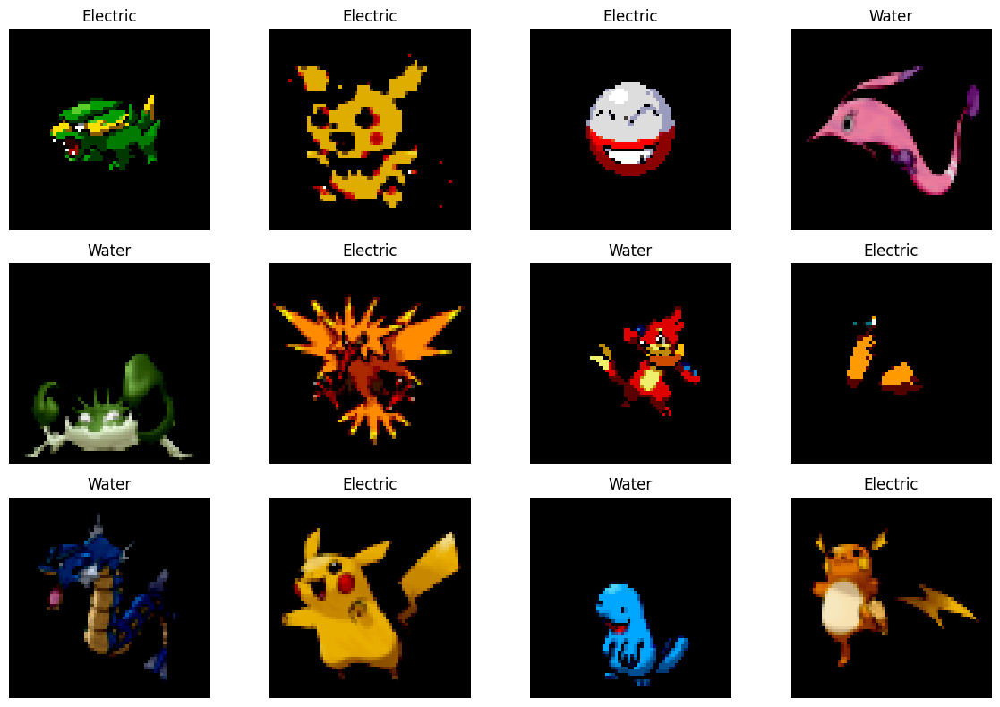

2025-06-27 00:36:09.686641: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [9]:
# Affichage d’un batch d’images avec leurs labels
for images, labels in dataset.take(1):
    plt.figure(figsize=(12, 8))
    for i in range(min(12, len(images))):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(images[i].numpy())
        label_index = labels[i].numpy()
        #print(label_index)
        label_name = class_map_reversed[label_index]
        plt.title(label_name)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

## Générateur

In [10]:
def make_generator_model(input_shape=(noise_dim,)):
    start_res = img_height // 16

    noise_input = layers.Input(shape=input_shape)
    y_label = layers.Input(shape=(1,))
    y_embedding = layers.Embedding(n_classes, 64)(y_label)

    y = layers.Dense(start_res*start_res)(y_embedding)
    y = layers.Reshape((start_res, start_res, 1))(y)

    x = layers.Dense(start_res*start_res*512)(noise_input)
    x = layers.Reshape((start_res, start_res, 512))(x)

    concat = layers.Concatenate()([x, y])

    x = layers.Conv2DTranspose(256, 5, strides=2, padding='same', use_bias=False)(concat)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2DTranspose(128, 5, strides=2, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2DTranspose(64, 5, strides=2, padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    outputs = layers.Conv2DTranspose(3, 5, strides=2, padding='same', use_bias=False, activation='tanh')(x)

    return tf.keras.Model([noise_input, y_label], outputs)


## Discriminateur

In [11]:
def make_discriminator_model(img_shape=(img_height, img_width, 3)):
    img_input = layers.Input(shape=img_shape)
    y_label = layers.Input(shape=(1,))
    y = layers.Embedding(n_classes, 128)(y_label)
    y = layers.Dense(img_shape[0]*img_shape[1])(y)
    y = layers.Reshape((img_shape[0], img_shape[1], 1))(y)

    concat = layers.Concatenate()([img_input, y])

    x = layers.Conv2D(64, 4, strides=2, padding="same", use_bias=False)(concat)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding="same", use_bias=False)(x)
    #x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding="same", use_bias=False)(x)
    #x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(512, 4, strides=2, padding="same", use_bias=False)(x)
    #x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1)(x)  # Pas d'activation (Wasserstein)
    return tf.keras.Model([img_input, y_label], x)


## Fonction de perte

In [12]:
def wasserstein_loss(y_true, y_pred):
    return tf.reduce_mean(y_true * y_pred)

def gradient_penalty(discriminator, real, fake, labels):
    alpha = tf.random.uniform([tf.shape(real)[0], 1, 1, 1], 0.0, 1.0)
    interpolated = real + alpha * (fake - real)
    
    with tf.GradientTape() as tape:
        tape.watch(interpolated)
        pred = discriminator([interpolated, labels], training=True)
    grads = tape.gradient(pred, interpolated)
    norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1,2,3]) + 1e-10)
    gp = tf.reduce_mean((norm - 1.0) ** 2)
    return gp


## Entrainement

In [13]:
class CWGAN(tf.keras.Model):
    def __init__(self, generator, discriminator, latent_dim=64, gp_weight=10, n_critic=5):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.gp_weight = gp_weight
        self.n_critic = n_critic

    def compile(self, g_optimizer, d_optimizer):
        super().compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.g_loss_tracker = tf.keras.metrics.Mean(name="gen_loss")
        self.d_loss_tracker = tf.keras.metrics.Mean(name="disc_loss")

    @property
    def metrics(self):
        return [self.g_loss_tracker, self.d_loss_tracker]

    def train_step(self, data):
        real_images, labels = data
        batch_size = tf.shape(real_images)[0]

        for _ in range(self.n_critic):
            noise = tf.random.normal((batch_size, self.latent_dim))
            with tf.GradientTape() as tape:
                fake_images = self.generator([noise, labels], training=True)
                d_real = self.discriminator([real_images, labels], training=True)
                d_fake = self.discriminator([fake_images, labels], training=True)
                gp = gradient_penalty(self.discriminator, real_images, fake_images, labels)
                d_loss = tf.reduce_mean(d_fake) - tf.reduce_mean(d_real) + self.gp_weight * gp
            grads = tape.gradient(d_loss, self.discriminator.trainable_variables)
            self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_variables))
        
        noise = tf.random.normal((batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            fake_images = self.generator([noise, labels], training=True)
            d_fake = self.discriminator([fake_images, labels], training=True)
            g_loss = -tf.reduce_mean(d_fake)
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.g_loss_tracker.update_state(g_loss)
        self.d_loss_tracker.update_state(d_loss)
        return {"gen_loss": self.g_loss_tracker.result(), "disc_loss": self.d_loss_tracker.result()}


# Enregistrement des images

In [14]:
# Callback pour sauvegarder et afficher images générées
class GenerateAndSaveImages(Callback):
    def __init__(self, generator, noise_dim, n_classes, output_dir="generated_images", interval=1, num_images=16, img_size=64):
        super().__init__()
        self.generator = generator
        self.noise_dim = noise_dim
        self.n_classes = n_classes
        self.output_dir = output_dir
        self.interval = interval
        self.num_images = num_images
        self.img_size = img_size
        os.makedirs(self.output_dir, exist_ok=True)

        # Seed fixe pour observer progrès
        self.seed_noise = tf.random.normal([self.num_images, self.noise_dim])
        self.seed_labels = tf.expand_dims(tf.random.uniform([self.num_images], minval=0, maxval=self.n_classes, dtype=tf.int32), axis=-1)

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            predictions = self.generator([self.seed_noise, self.seed_labels], training=False)
            predictions = (predictions + 1.0) / 2.0  # tanh -> [0, 1]

            fig = plt.figure(figsize=(4,4))
            for i in range(self.num_images):
                plt.subplot(4, 4, i + 1)
                plt.imshow(predictions[i])
                plt.axis("off")
            plt.suptitle(f"Epoch {epoch+1}")
            plt.tight_layout()
            # Sauvegarde grille image
            img_path = os.path.join(self.output_dir, f"epoch_{epoch+1:03d}.png")
            plt.savefig(img_path)
            plt.show()
            plt.close()

## Lancement

Epoch 1/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -97.2457 - gen_loss: -101.5190

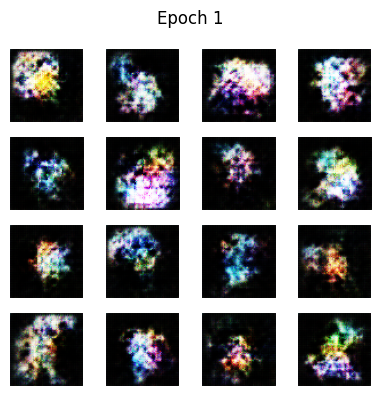

235/235 ━━━━━━━━━━━━━━━━━━━━ 246s 1s/step - disc_loss: -97.0435 - gen_loss: -101.5884
Epoch 2/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 901ms/step - disc_loss: -14.9262 - gen_loss: -139.9588

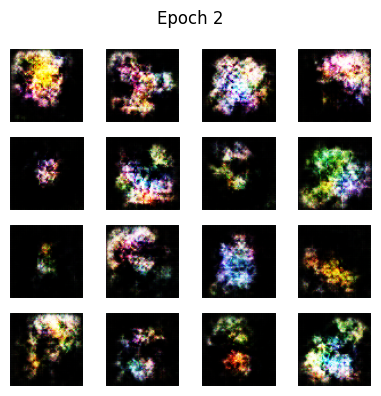

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 902ms/step - disc_loss: -14.9258 - gen_loss: -139.9519
Epoch 3/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 899ms/step - disc_loss: -12.9834 - gen_loss: -117.8633

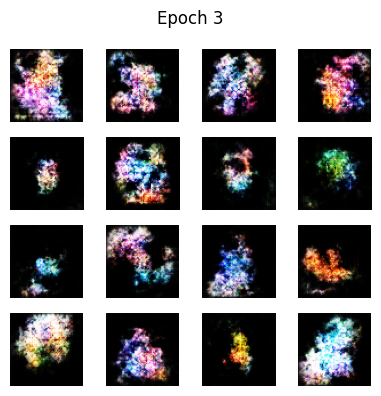

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 901ms/step - disc_loss: -12.9836 - gen_loss: -117.9104
Epoch 4/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 898ms/step - disc_loss: -12.5713 - gen_loss: -190.6256

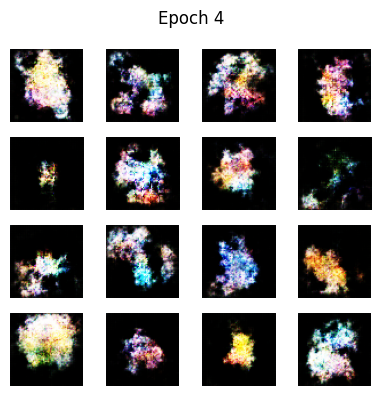

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 899ms/step - disc_loss: -12.5726 - gen_loss: -190.6156
Epoch 5/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -11.8054 - gen_loss: -225.3335

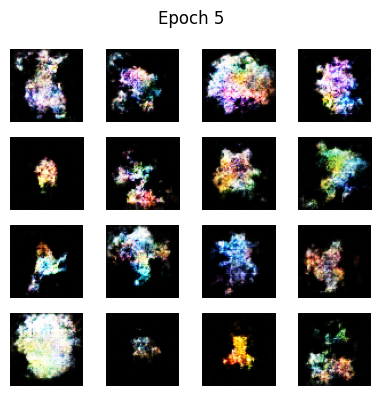

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 908ms/step - disc_loss: -11.8072 - gen_loss: -225.2278
Epoch 6/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 903ms/step - disc_loss: -11.8401 - gen_loss: -209.1069

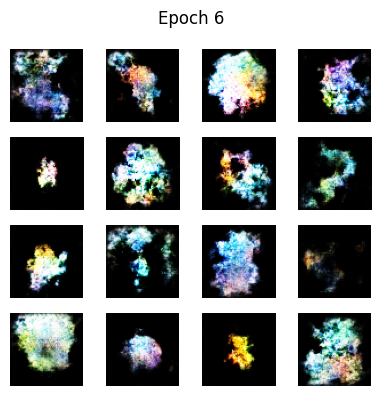

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 904ms/step - disc_loss: -11.8406 - gen_loss: -209.0321
Epoch 7/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 921ms/step - disc_loss: -10.6697 - gen_loss: -179.8489

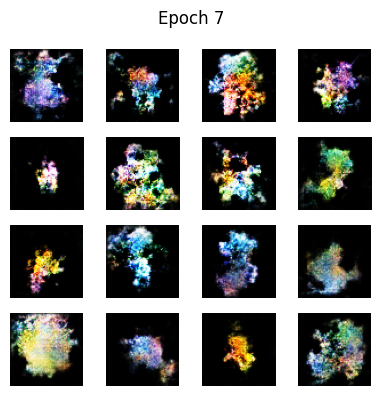

235/235 ━━━━━━━━━━━━━━━━━━━━ 217s 922ms/step - disc_loss: -10.6706 - gen_loss: -179.7854
Epoch 8/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 922ms/step - disc_loss: -10.7688 - gen_loss: -151.1995

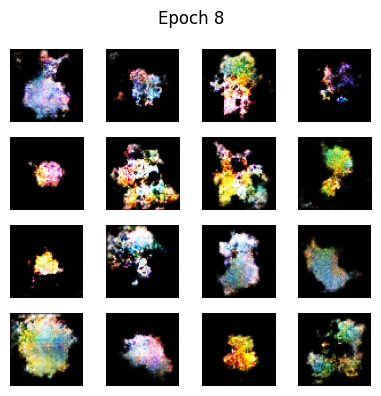

235/235 ━━━━━━━━━━━━━━━━━━━━ 217s 922ms/step - disc_loss: -10.7698 - gen_loss: -151.1259
Epoch 9/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 913ms/step - disc_loss: -10.2469 - gen_loss: -121.8576

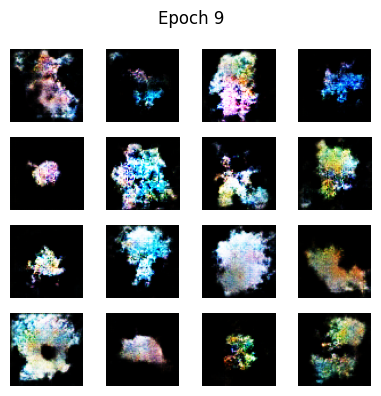

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 914ms/step - disc_loss: -10.2490 - gen_loss: -121.8082
Epoch 10/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 914ms/step - disc_loss: -10.3507 - gen_loss: -91.6759

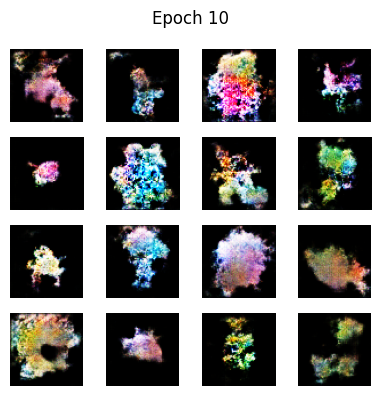

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 915ms/step - disc_loss: -10.3529 - gen_loss: -91.6548
Epoch 11/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 926ms/step - disc_loss: -10.7600 - gen_loss: -64.3491

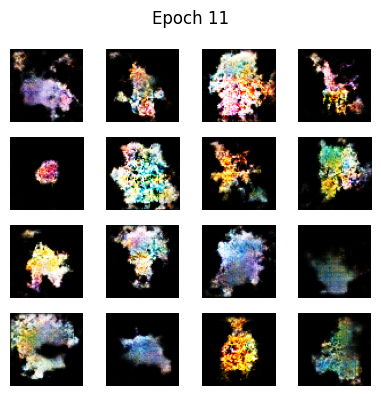

235/235 ━━━━━━━━━━━━━━━━━━━━ 218s 927ms/step - disc_loss: -10.7607 - gen_loss: -64.3254
Epoch 12/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 919ms/step - disc_loss: -10.6692 - gen_loss: -58.4150

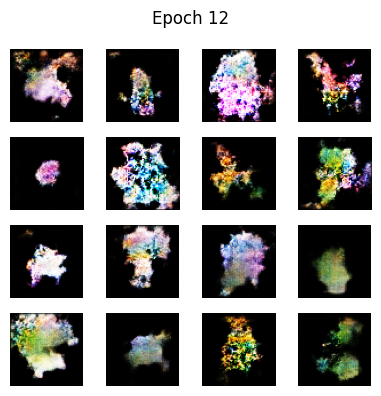

235/235 ━━━━━━━━━━━━━━━━━━━━ 216s 921ms/step - disc_loss: -10.6703 - gen_loss: -58.3876
Epoch 13/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 911ms/step - disc_loss: -10.7336 - gen_loss: -44.3197

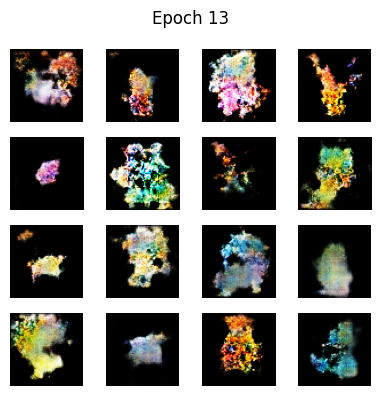

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 912ms/step - disc_loss: -10.7346 - gen_loss: -44.3035
Epoch 14/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 914ms/step - disc_loss: -10.7866 - gen_loss: -42.4537

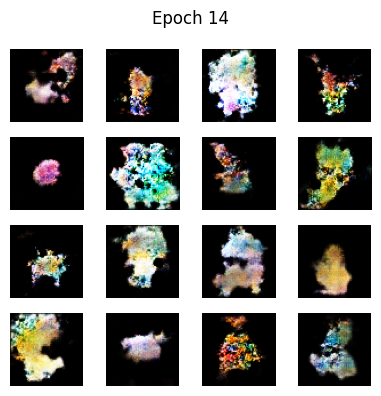

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 915ms/step - disc_loss: -10.7876 - gen_loss: -42.4242
Epoch 15/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 914ms/step - disc_loss: -11.4442 - gen_loss: -38.8448

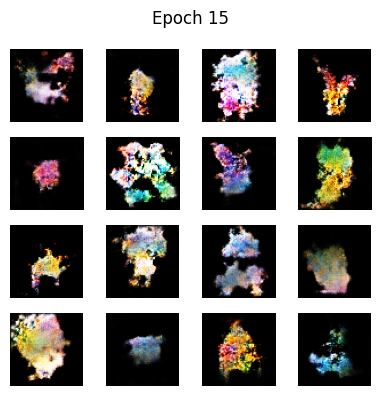

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 915ms/step - disc_loss: -11.4441 - gen_loss: -38.8038
Epoch 16/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 922ms/step - disc_loss: -10.3542 - gen_loss: -38.6384

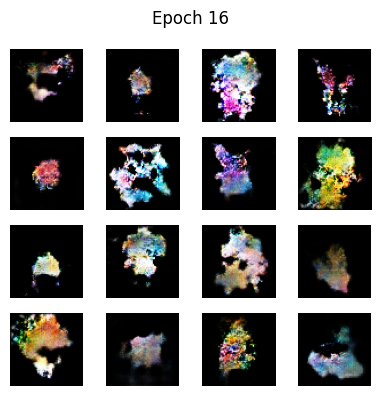

235/235 ━━━━━━━━━━━━━━━━━━━━ 217s 923ms/step - disc_loss: -10.3566 - gen_loss: -38.6509
Epoch 17/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 916ms/step - disc_loss: -10.6539 - gen_loss: -39.2735

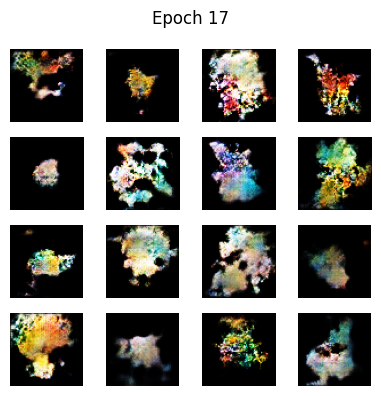

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 917ms/step - disc_loss: -10.6546 - gen_loss: -39.2200
Epoch 18/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 915ms/step - disc_loss: -10.4566 - gen_loss: -31.2731

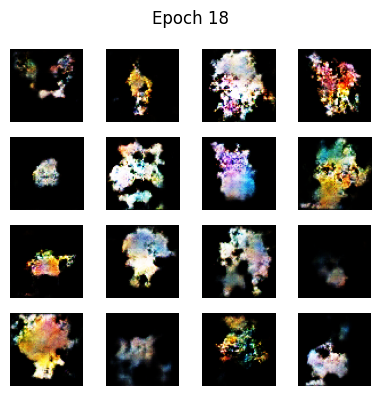

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 916ms/step - disc_loss: -10.4568 - gen_loss: -31.2817
Epoch 19/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 909ms/step - disc_loss: -10.5941 - gen_loss: -38.4124

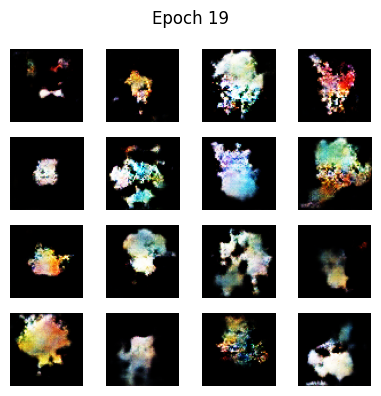

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 910ms/step - disc_loss: -10.5959 - gen_loss: -38.3423
Epoch 20/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 904ms/step - disc_loss: -10.6114 - gen_loss: -27.2378

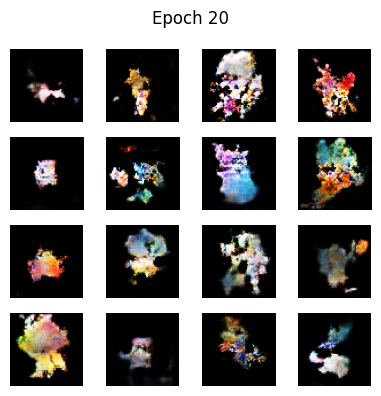

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 905ms/step - disc_loss: -10.6119 - gen_loss: -27.2310
Epoch 21/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 902ms/step - disc_loss: -10.4694 - gen_loss: -0.1964

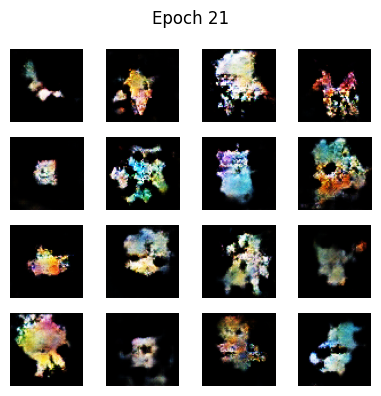

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 904ms/step - disc_loss: -10.4706 - gen_loss: -0.1956
Epoch 22/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 904ms/step - disc_loss: -10.1088 - gen_loss: -17.2221

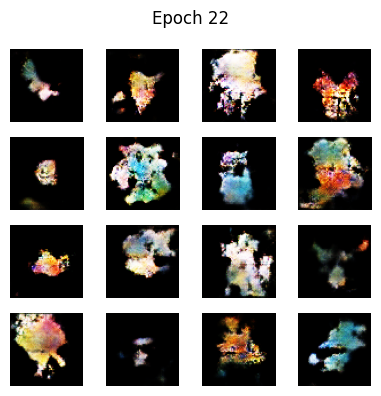

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 905ms/step - disc_loss: -10.1116 - gen_loss: -17.1830
Epoch 23/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -9.9846 - gen_loss: -5.4807

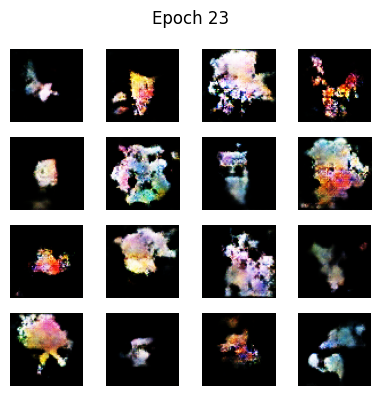

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 898ms/step - disc_loss: -9.9866 - gen_loss: -5.5091
Epoch 24/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -9.9814 - gen_loss: -2.5723

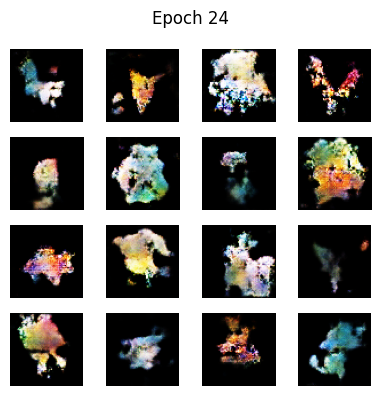

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 898ms/step - disc_loss: -9.9836 - gen_loss: -2.5623
Epoch 25/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -10.7137 - gen_loss: -20.4876

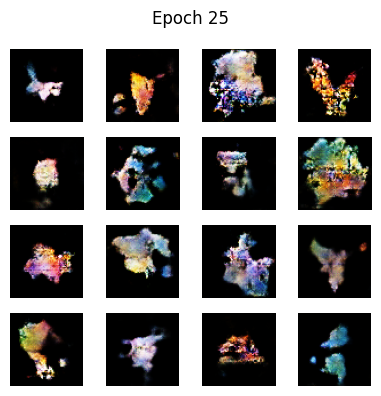

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -10.7134 - gen_loss: -20.4644
Epoch 26/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -10.2314 - gen_loss: 10.9378

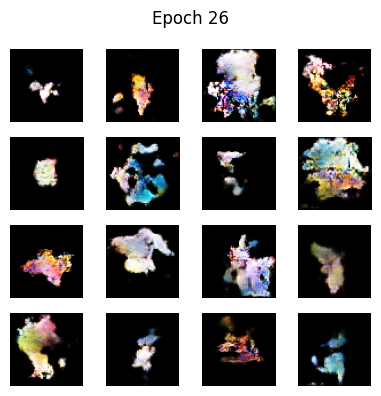

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -10.2319 - gen_loss: 10.8882
Epoch 27/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 896ms/step - disc_loss: -10.3681 - gen_loss: -17.1032

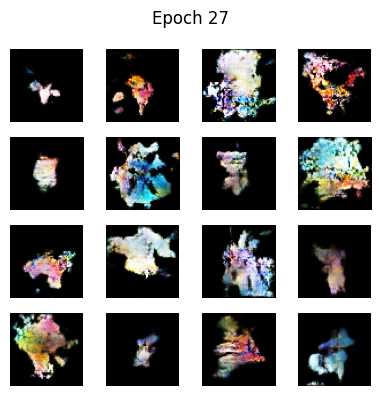

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 896ms/step - disc_loss: -10.3699 - gen_loss: -17.0489
Epoch 28/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 896ms/step - disc_loss: -10.3755 - gen_loss: -13.9849

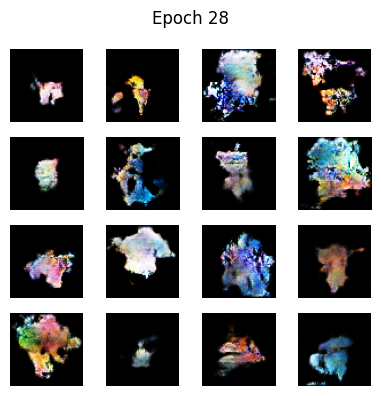

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -10.3761 - gen_loss: -13.9632
Epoch 29/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 898ms/step - disc_loss: -10.2618 - gen_loss: 6.6468

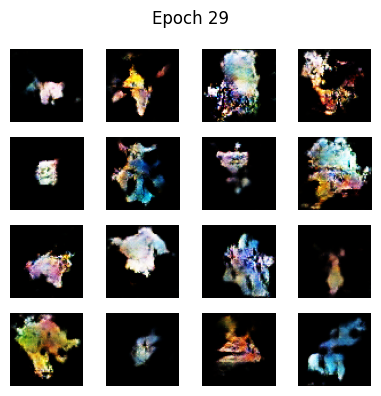

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 899ms/step - disc_loss: -10.2636 - gen_loss: 6.6099
Epoch 30/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 896ms/step - disc_loss: -11.0436 - gen_loss: -2.8824

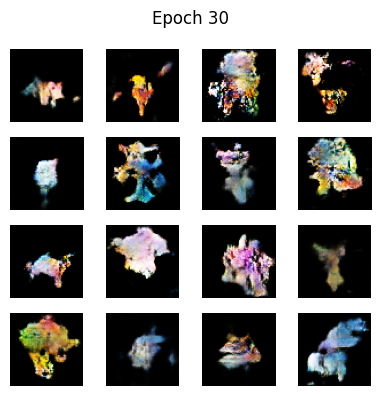

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -11.0431 - gen_loss: -2.9005
Epoch 31/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 896ms/step - disc_loss: -10.4458 - gen_loss: -6.6731

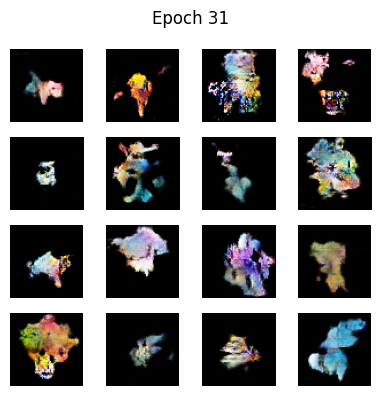

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -10.4470 - gen_loss: -6.6501
Epoch 32/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 906ms/step - disc_loss: -10.8222 - gen_loss: 23.5493

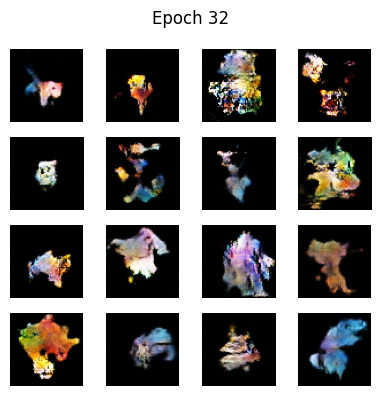

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 907ms/step - disc_loss: -10.8231 - gen_loss: 23.5083
Epoch 33/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 902ms/step - disc_loss: -10.4055 - gen_loss: 16.6486

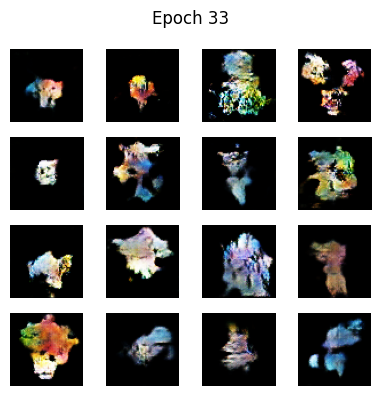

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 903ms/step - disc_loss: -10.4084 - gen_loss: 16.6425
Epoch 34/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -10.1659 - gen_loss: 9.4068

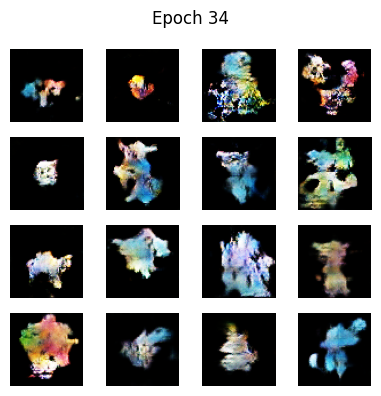

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 908ms/step - disc_loss: -10.1679 - gen_loss: 9.4431
Epoch 35/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 902ms/step - disc_loss: -10.5324 - gen_loss: 29.9384

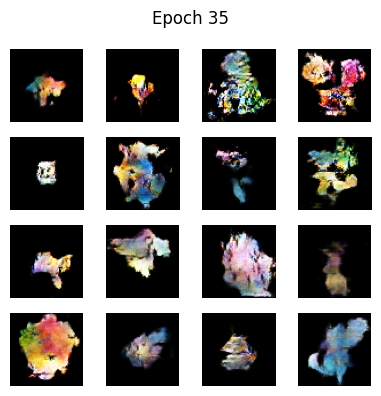

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 903ms/step - disc_loss: -10.5335 - gen_loss: 29.8818
Epoch 36/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 902ms/step - disc_loss: -10.7018 - gen_loss: 21.1803

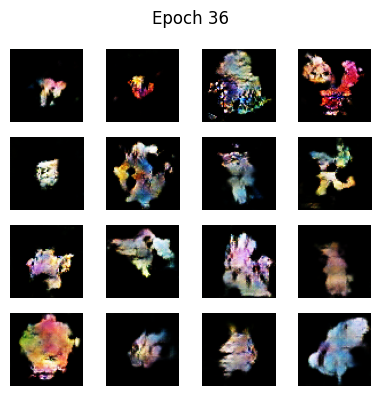

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 903ms/step - disc_loss: -10.7040 - gen_loss: 21.1535
Epoch 37/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 908ms/step - disc_loss: -10.3305 - gen_loss: 26.8083

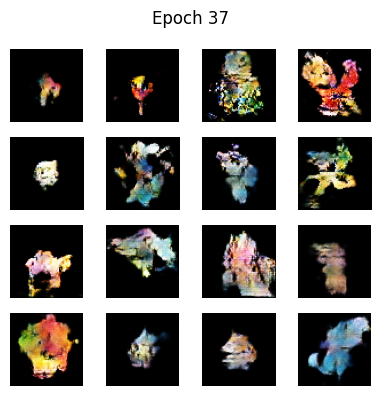

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 909ms/step - disc_loss: -10.3322 - gen_loss: 26.7810
Epoch 38/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - disc_loss: -10.6858 - gen_loss: -11.6348

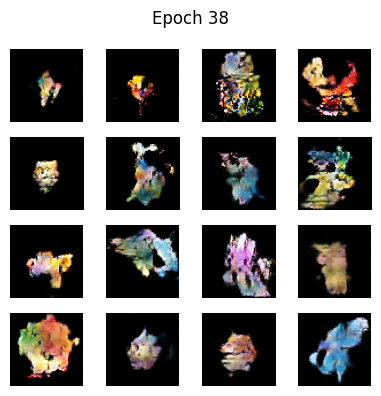

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 907ms/step - disc_loss: -10.6867 - gen_loss: -11.5533
Epoch 39/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - disc_loss: -10.9609 - gen_loss: 17.1911

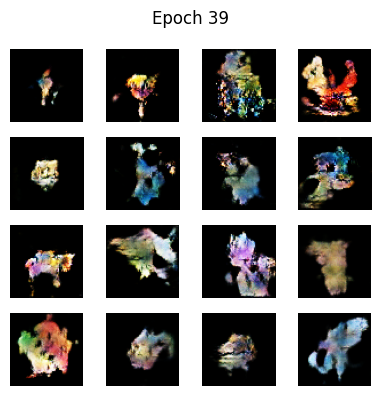

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 906ms/step - disc_loss: -10.9618 - gen_loss: 17.1792
Epoch 40/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - disc_loss: -10.4190 - gen_loss: 2.8322

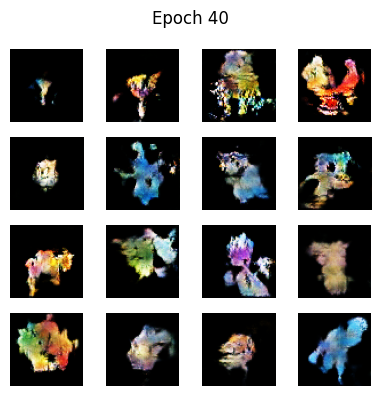

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 906ms/step - disc_loss: -10.4210 - gen_loss: 2.8376
Epoch 41/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -10.8293 - gen_loss: 9.8619

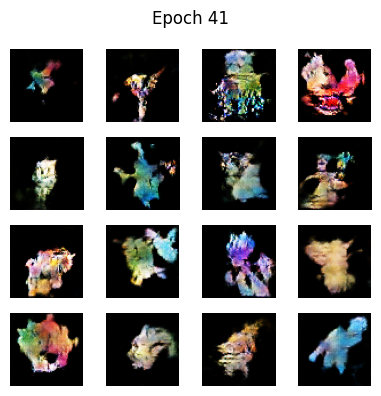

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 907ms/step - disc_loss: -10.8309 - gen_loss: 9.8883
Epoch 42/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 910ms/step - disc_loss: -11.1005 - gen_loss: 18.2599

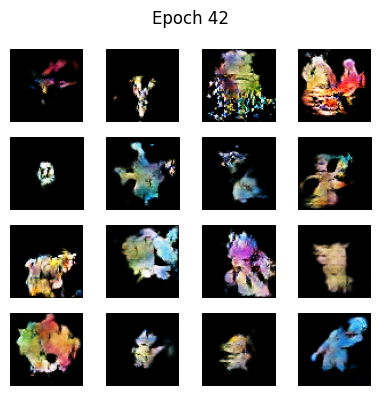

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 911ms/step - disc_loss: -11.1014 - gen_loss: 18.2403
Epoch 43/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 977ms/step - disc_loss: -10.7332 - gen_loss: 8.0067

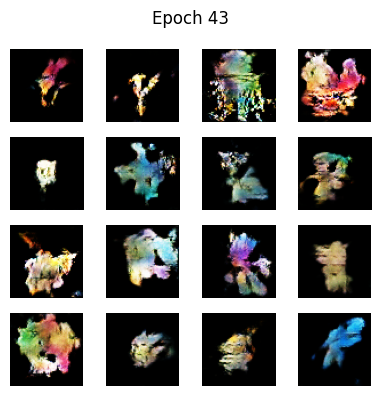

235/235 ━━━━━━━━━━━━━━━━━━━━ 230s 979ms/step - disc_loss: -10.7343 - gen_loss: 8.0003
Epoch 44/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.4585 - gen_loss: 25.8602

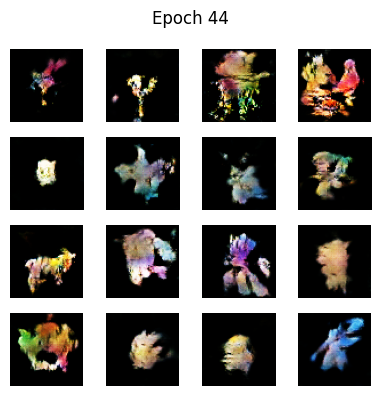

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.4589 - gen_loss: 25.8375
Epoch 45/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.2843 - gen_loss: 4.2631

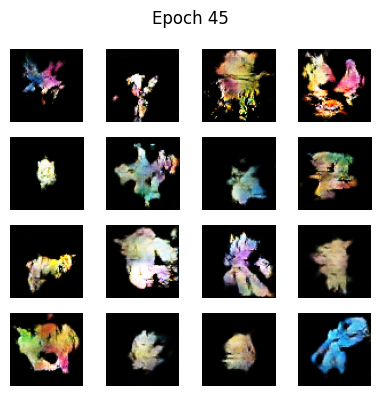

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.2853 - gen_loss: 4.3431
Epoch 46/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -10.5208 - gen_loss: 27.6243

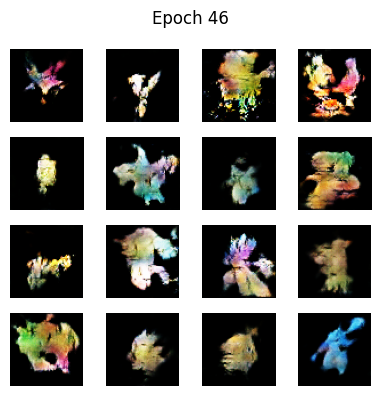

235/235 ━━━━━━━━━━━━━━━━━━━━ 307s 1s/step - disc_loss: -10.5238 - gen_loss: 27.5767
Epoch 47/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -10.9933 - gen_loss: 32.8083

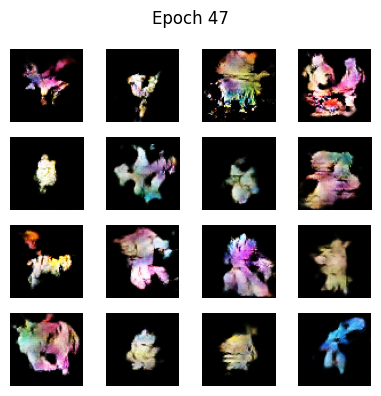

235/235 ━━━━━━━━━━━━━━━━━━━━ 308s 1s/step - disc_loss: -10.9945 - gen_loss: 32.8141
Epoch 48/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.0313 - gen_loss: 39.0704

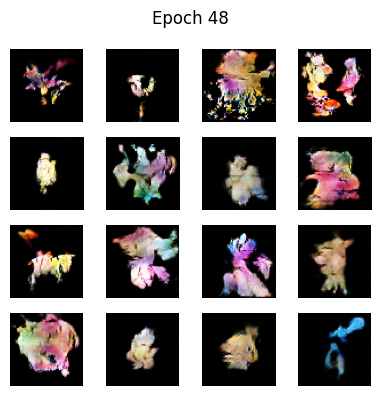

235/235 ━━━━━━━━━━━━━━━━━━━━ 309s 1s/step - disc_loss: -11.0329 - gen_loss: 38.9487
Epoch 49/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.2604 - gen_loss: 15.8699

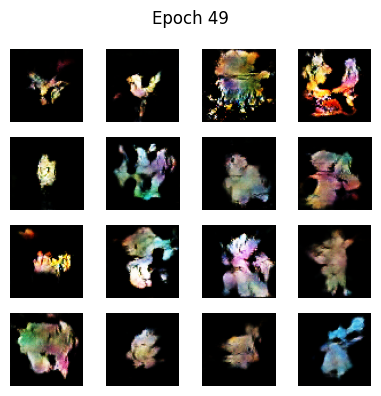

235/235 ━━━━━━━━━━━━━━━━━━━━ 308s 1s/step - disc_loss: -11.2621 - gen_loss: 15.9073
Epoch 50/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -10.6568 - gen_loss: 14.1944

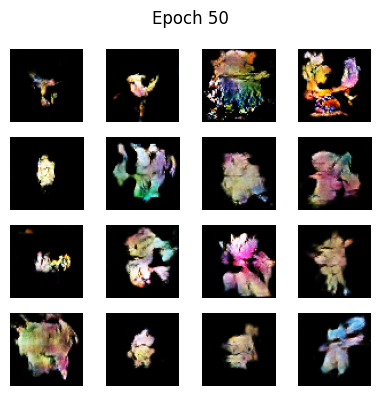

235/235 ━━━━━━━━━━━━━━━━━━━━ 291s 1s/step - disc_loss: -10.6591 - gen_loss: 14.1392
Epoch 51/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 909ms/step - disc_loss: -10.6270 - gen_loss: -4.2664

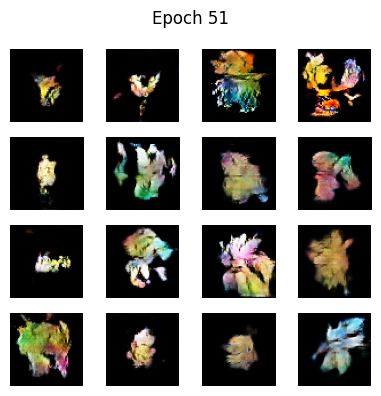

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 910ms/step - disc_loss: -10.6292 - gen_loss: -4.2226
Epoch 52/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 898ms/step - disc_loss: -10.7461 - gen_loss: 7.8644

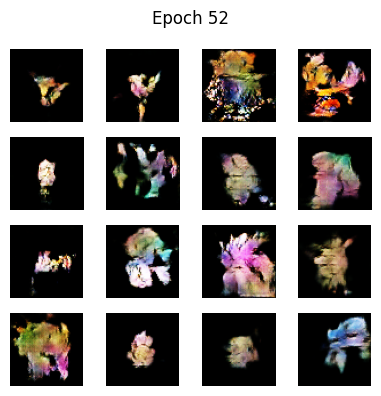

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 899ms/step - disc_loss: -10.7484 - gen_loss: 7.8688
Epoch 53/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 902ms/step - disc_loss: -11.3183 - gen_loss: -22.1245

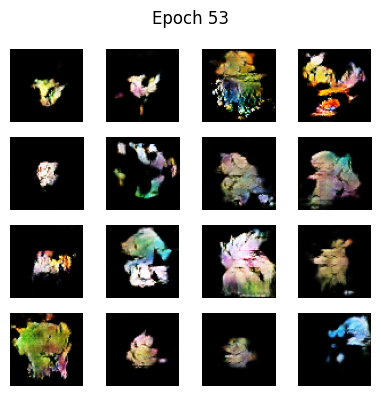

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 902ms/step - disc_loss: -11.3191 - gen_loss: -22.0680
Epoch 54/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -11.3130 - gen_loss: 8.4764

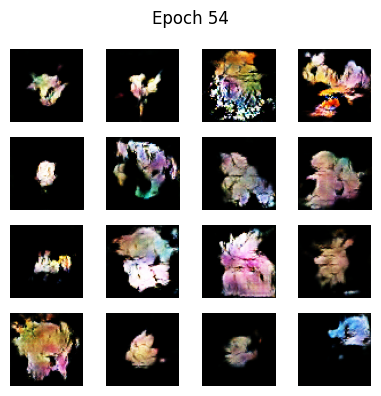

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 898ms/step - disc_loss: -11.3155 - gen_loss: 8.3966
Epoch 55/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 901ms/step - disc_loss: -11.3901 - gen_loss: -16.6974

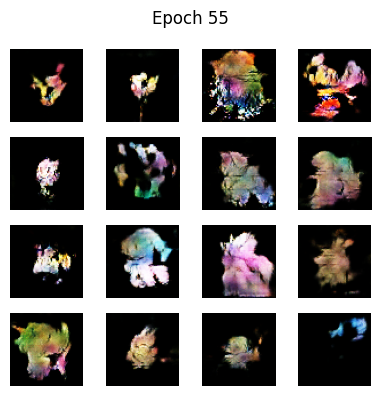

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 901ms/step - disc_loss: -11.3901 - gen_loss: -16.6079
Epoch 56/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 899ms/step - disc_loss: -11.0743 - gen_loss: 32.2871

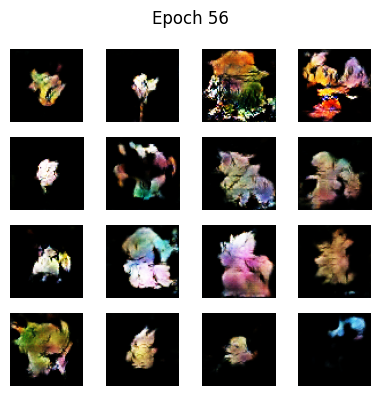

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 901ms/step - disc_loss: -11.0766 - gen_loss: 32.2619
Epoch 57/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 900ms/step - disc_loss: -10.8815 - gen_loss: 20.0651

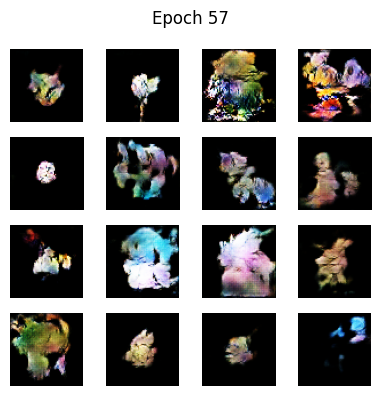

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 901ms/step - disc_loss: -10.8844 - gen_loss: 20.0808
Epoch 58/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -11.1536 - gen_loss: 7.3575

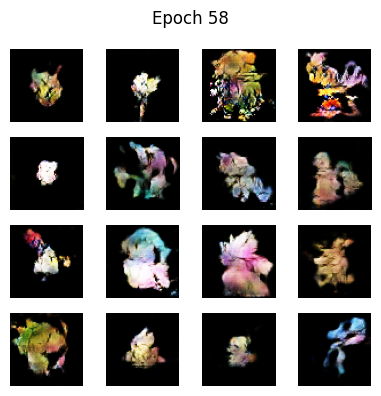

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -11.1556 - gen_loss: 7.3544
Epoch 59/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -11.2455 - gen_loss: -16.3715

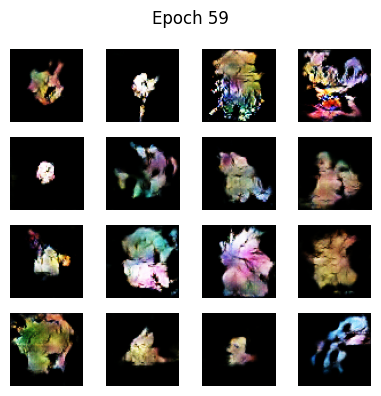

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 898ms/step - disc_loss: -11.2473 - gen_loss: -16.3462
Epoch 60/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 897ms/step - disc_loss: -11.2632 - gen_loss: 20.2160

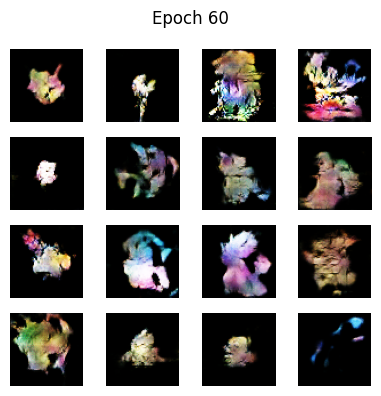

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -11.2650 - gen_loss: 20.1791
Epoch 61/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 896ms/step - disc_loss: -11.2027 - gen_loss: 40.8006

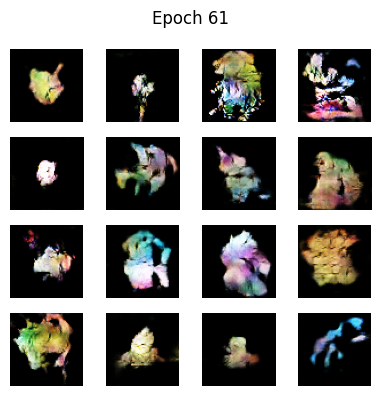

235/235 ━━━━━━━━━━━━━━━━━━━━ 211s 897ms/step - disc_loss: -11.2043 - gen_loss: 40.8126
Epoch 62/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 895ms/step - disc_loss: -11.2806 - gen_loss: 19.5332

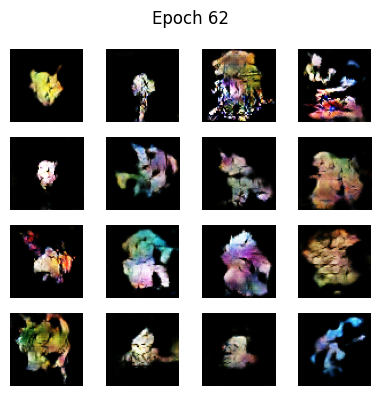

235/235 ━━━━━━━━━━━━━━━━━━━━ 210s 895ms/step - disc_loss: -11.2829 - gen_loss: 19.4874
Epoch 63/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 894ms/step - disc_loss: -11.3164 - gen_loss: -14.5253

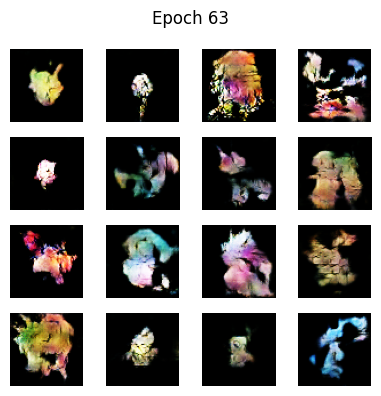

235/235 ━━━━━━━━━━━━━━━━━━━━ 210s 895ms/step - disc_loss: -11.3185 - gen_loss: -14.4427
Epoch 64/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 900ms/step - disc_loss: -11.6635 - gen_loss: 1.7461

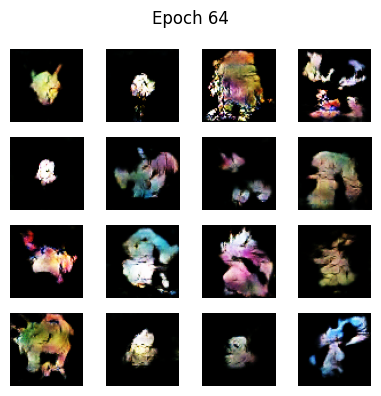

235/235 ━━━━━━━━━━━━━━━━━━━━ 212s 900ms/step - disc_loss: -11.6638 - gen_loss: 1.7774
Epoch 65/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 904ms/step - disc_loss: -11.1897 - gen_loss: 25.9854

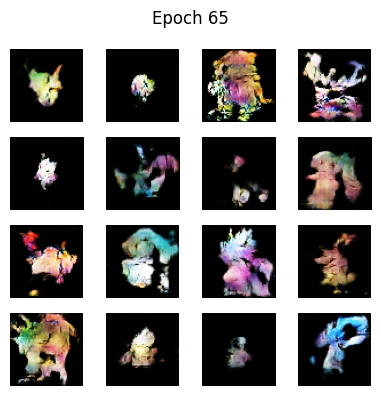

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 906ms/step - disc_loss: -11.1920 - gen_loss: 25.9872
Epoch 66/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 905ms/step - disc_loss: -11.7020 - gen_loss: -2.8755

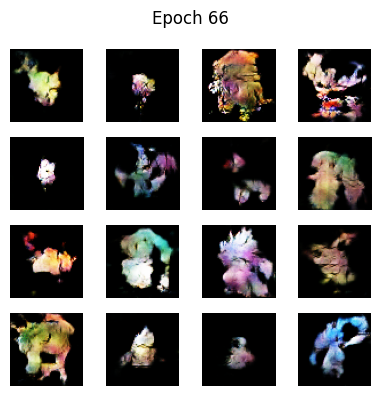

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 906ms/step - disc_loss: -11.7024 - gen_loss: -2.8028
Epoch 67/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 893ms/step - disc_loss: -11.7859 - gen_loss: 10.5009

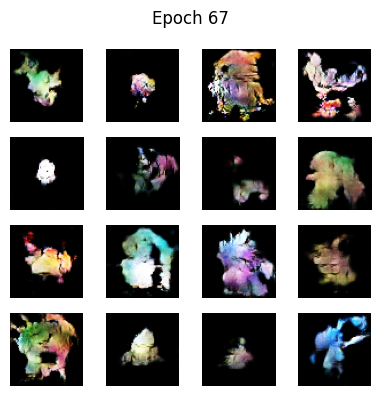

235/235 ━━━━━━━━━━━━━━━━━━━━ 210s 894ms/step - disc_loss: -11.7872 - gen_loss: 10.4807
Epoch 68/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 59s/step - disc_loss: -11.3397 - gen_loss: 16.1811 

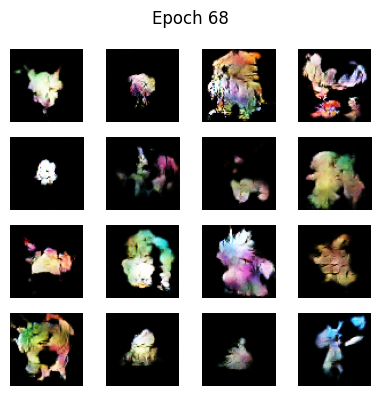

235/235 ━━━━━━━━━━━━━━━━━━━━ 13699s 59s/step - disc_loss: -11.3407 - gen_loss: 16.0801
Epoch 69/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.6193 - gen_loss: 9.8970

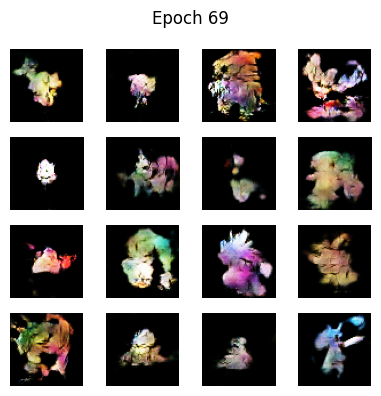

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.6213 - gen_loss: 9.8984
Epoch 70/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.2999 - gen_loss: -7.9797

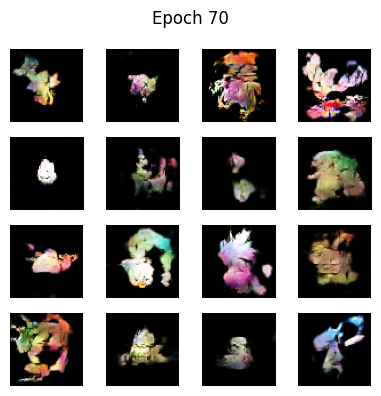

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.3023 - gen_loss: -7.9444
Epoch 71/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.4096 - gen_loss: 12.0271

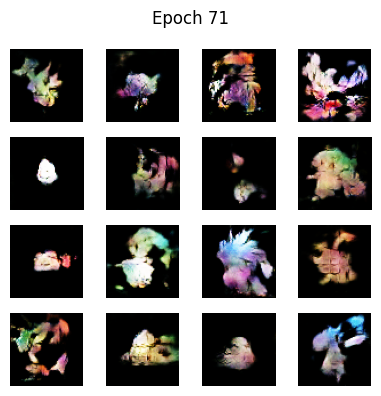

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.4114 - gen_loss: 12.0020
Epoch 72/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.5648 - gen_loss: 12.7601

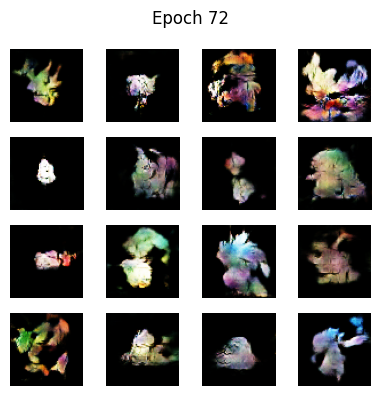

235/235 ━━━━━━━━━━━━━━━━━━━━ 305s 1s/step - disc_loss: -11.5665 - gen_loss: 12.7987
Epoch 73/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.5238 - gen_loss: 31.0000

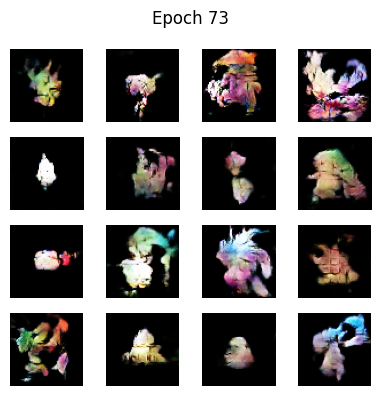

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.5258 - gen_loss: 30.9216
Epoch 74/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.8349 - gen_loss: 16.1355

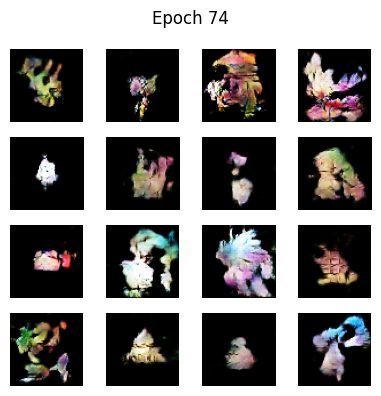

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.8361 - gen_loss: 16.1294
Epoch 75/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.7435 - gen_loss: 26.6650

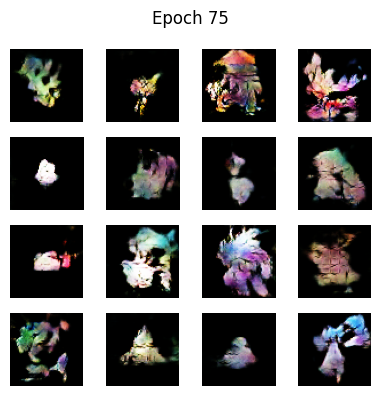

235/235 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - disc_loss: -11.7457 - gen_loss: 26.6072
Epoch 76/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.7208 - gen_loss: 19.8924

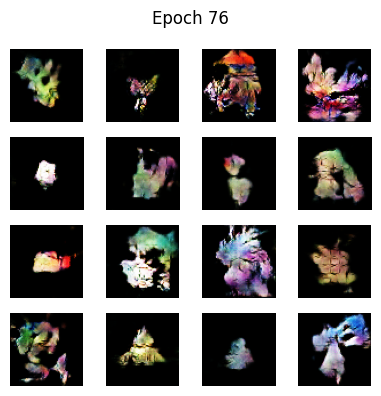

235/235 ━━━━━━━━━━━━━━━━━━━━ 305s 1s/step - disc_loss: -11.7224 - gen_loss: 19.8394
Epoch 77/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - disc_loss: -11.4951 - gen_loss: 0.4800

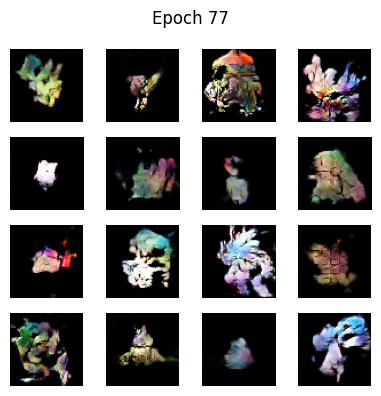

235/235 ━━━━━━━━━━━━━━━━━━━━ 479s 2s/step - disc_loss: -11.4971 - gen_loss: 0.4906
Epoch 78/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - disc_loss: -11.8004 - gen_loss: 28.8460

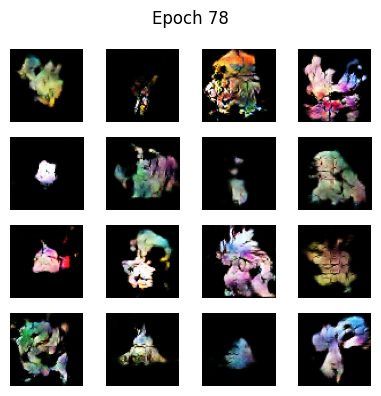

235/235 ━━━━━━━━━━━━━━━━━━━━ 258s 1s/step - disc_loss: -11.8012 - gen_loss: 28.7989
Epoch 79/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 919ms/step - disc_loss: -11.7359 - gen_loss: 13.7116

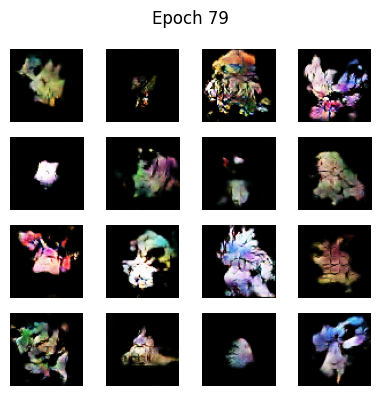

235/235 ━━━━━━━━━━━━━━━━━━━━ 216s 920ms/step - disc_loss: -11.7375 - gen_loss: 13.7173
Epoch 80/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 914ms/step - disc_loss: -11.5422 - gen_loss: 4.9337

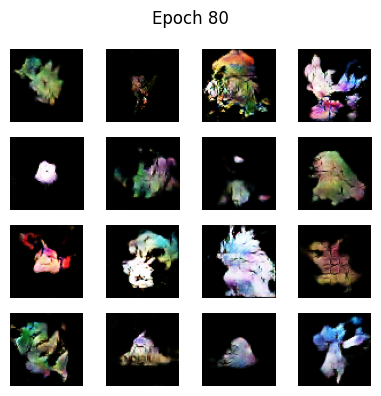

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 915ms/step - disc_loss: -11.5455 - gen_loss: 4.8923
Epoch 81/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 915ms/step - disc_loss: -11.2564 - gen_loss: 0.3210

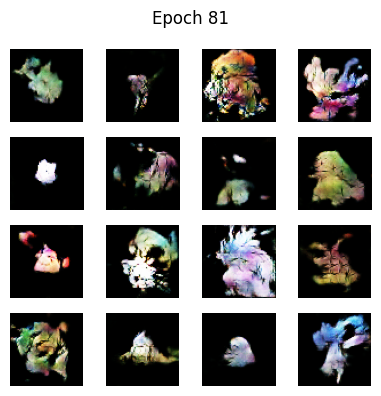

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 916ms/step - disc_loss: -11.2593 - gen_loss: 0.3022
Epoch 82/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 917ms/step - disc_loss: -11.6508 - gen_loss: 23.8107

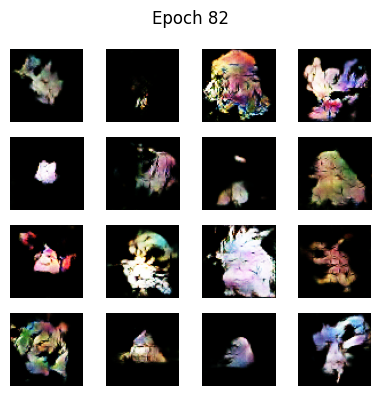

235/235 ━━━━━━━━━━━━━━━━━━━━ 216s 918ms/step - disc_loss: -11.6525 - gen_loss: 23.7806
Epoch 83/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 916ms/step - disc_loss: -11.6170 - gen_loss: 19.0685

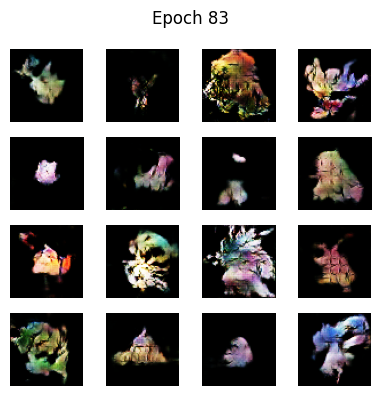

235/235 ━━━━━━━━━━━━━━━━━━━━ 216s 918ms/step - disc_loss: -11.6196 - gen_loss: 19.0512
Epoch 84/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 917ms/step - disc_loss: -11.7060 - gen_loss: 6.8557

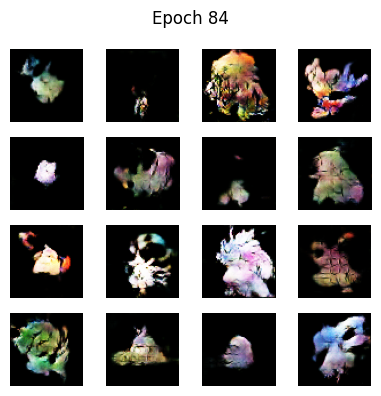

235/235 ━━━━━━━━━━━━━━━━━━━━ 216s 917ms/step - disc_loss: -11.7083 - gen_loss: 6.8630
Epoch 85/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 915ms/step - disc_loss: -11.5286 - gen_loss: -4.5318

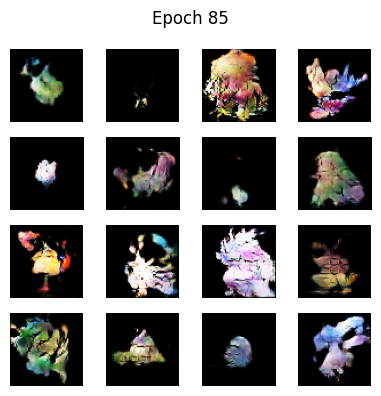

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 916ms/step - disc_loss: -11.5313 - gen_loss: -4.5027
Epoch 86/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 910ms/step - disc_loss: -11.7920 - gen_loss: 31.0539

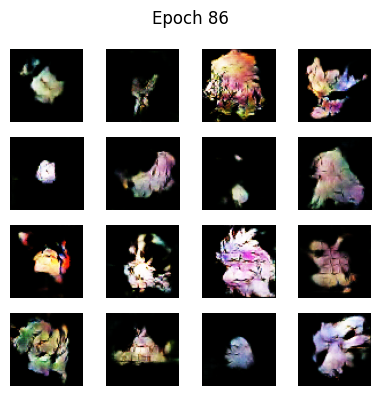

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 910ms/step - disc_loss: -11.7936 - gen_loss: 31.0199
Epoch 87/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 911ms/step - disc_loss: -11.4499 - gen_loss: 24.6159

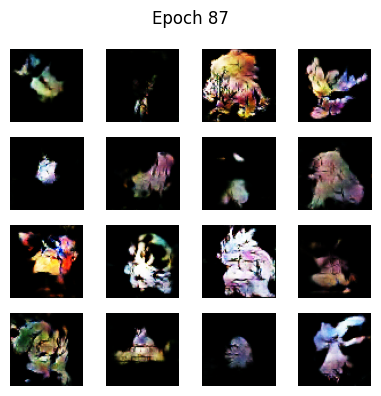

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 912ms/step - disc_loss: -11.4531 - gen_loss: 24.5718
Epoch 88/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 924ms/step - disc_loss: -11.4890 - gen_loss: 34.1893

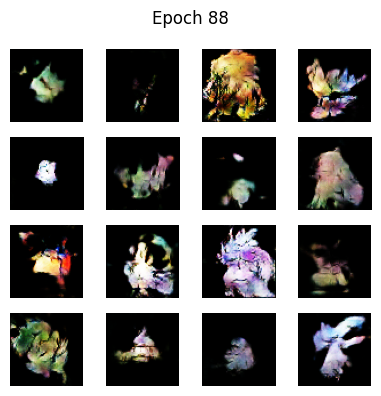

235/235 ━━━━━━━━━━━━━━━━━━━━ 217s 925ms/step - disc_loss: -11.4920 - gen_loss: 34.1629
Epoch 89/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 912ms/step - disc_loss: -11.8578 - gen_loss: 26.5970

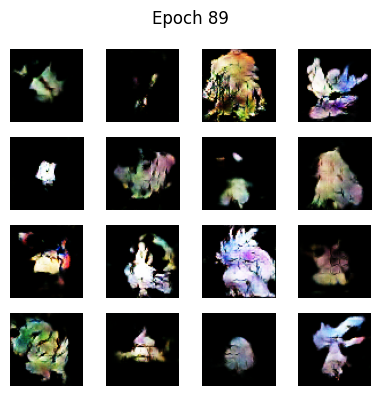

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 913ms/step - disc_loss: -11.8592 - gen_loss: 26.5795
Epoch 90/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 910ms/step - disc_loss: -11.7295 - gen_loss: 20.0147

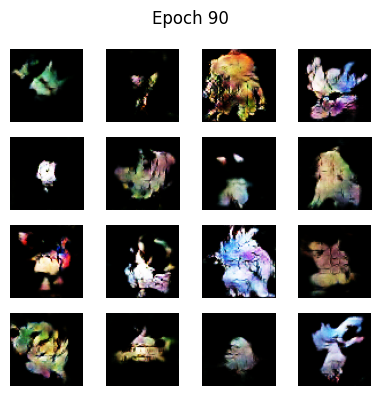

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 910ms/step - disc_loss: -11.7314 - gen_loss: 20.0143
Epoch 91/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 913ms/step - disc_loss: -11.8282 - gen_loss: 12.8348

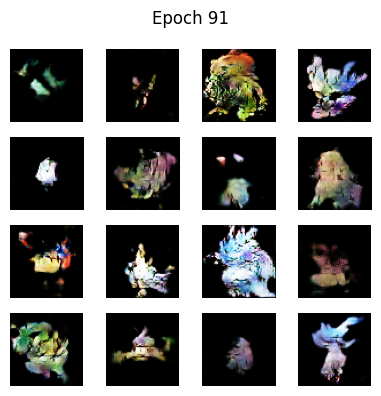

235/235 ━━━━━━━━━━━━━━━━━━━━ 215s 913ms/step - disc_loss: -11.8306 - gen_loss: 12.7810
Epoch 92/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -11.9281 - gen_loss: 5.8992

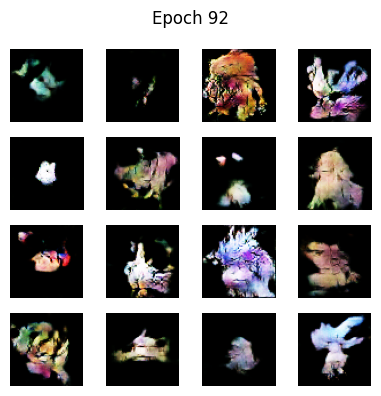

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 910ms/step - disc_loss: -11.9302 - gen_loss: 5.9174
Epoch 93/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -12.2162 - gen_loss: 0.5021

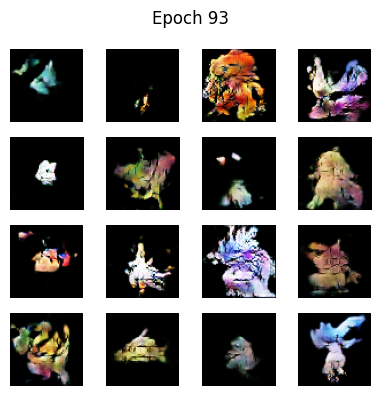

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 907ms/step - disc_loss: -12.2171 - gen_loss: 0.4944
Epoch 94/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -12.0202 - gen_loss: -18.4096

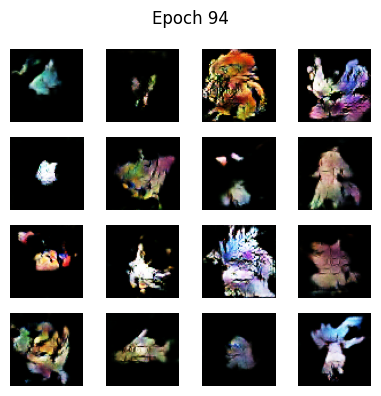

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 908ms/step - disc_loss: -12.0214 - gen_loss: -18.3471
Epoch 95/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -11.8899 - gen_loss: 10.5726

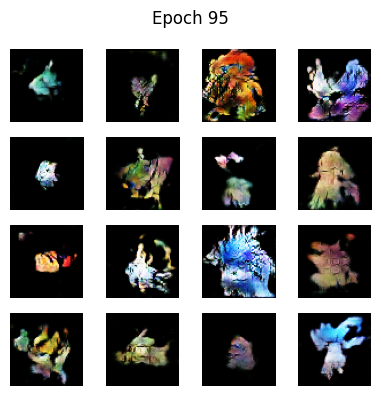

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 908ms/step - disc_loss: -11.8919 - gen_loss: 10.6049
Epoch 96/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 908ms/step - disc_loss: -12.0023 - gen_loss: 35.2358

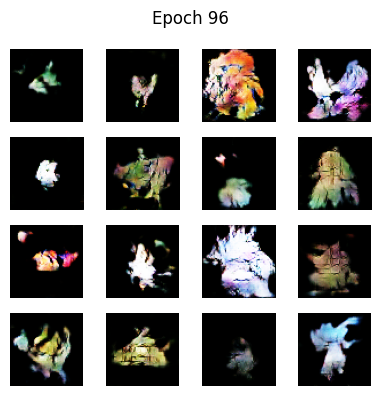

235/235 ━━━━━━━━━━━━━━━━━━━━ 214s 909ms/step - disc_loss: -12.0045 - gen_loss: 35.1261
Epoch 97/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 908ms/step - disc_loss: -12.1227 - gen_loss: 18.1280

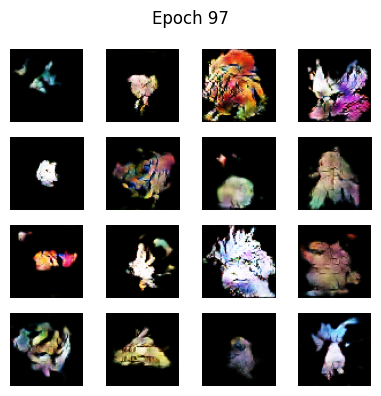

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 908ms/step - disc_loss: -12.1250 - gen_loss: 18.1177
Epoch 98/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 907ms/step - disc_loss: -11.8636 - gen_loss: 8.0392

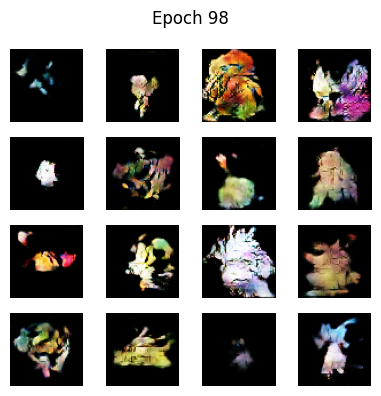

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 908ms/step - disc_loss: -11.8663 - gen_loss: 8.0930
Epoch 99/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 906ms/step - disc_loss: -12.1141 - gen_loss: 6.7571

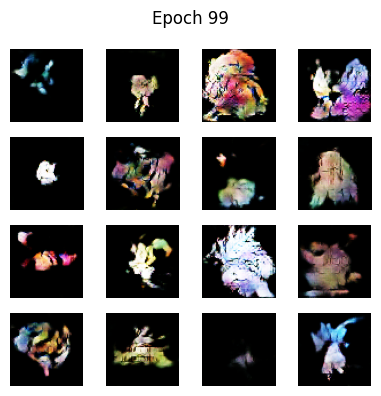

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 907ms/step - disc_loss: -12.1169 - gen_loss: 6.8123
Epoch 100/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 906ms/step - disc_loss: -12.3558 - gen_loss: 73.3398

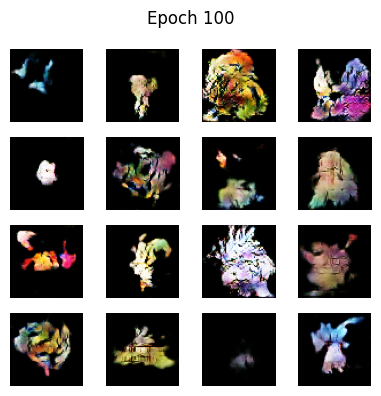

235/235 ━━━━━━━━━━━━━━━━━━━━ 213s 907ms/step - disc_loss: -12.3572 - gen_loss: 73.2006


In [49]:
generator = make_generator_model()
discriminator = make_discriminator_model()
c_wgan = CWGAN(generator, discriminator, latent_dim=noise_dim)

c_wgan.compile(
    g_optimizer=tf.keras.optimizers.Adam(0.0002, beta_1=0.5),
    d_optimizer=tf.keras.optimizers.Adam(0.0002, beta_1=0.5),
)
callback_images = GenerateAndSaveImages(c_wgan.generator, noise_dim, n_classes, output_dir="generated_images_POKEMON_cWGAN", interval=1, num_images=16, img_size=img_width)
# Dataset : (images, labels) -> batch & shuffle
c_wgan.fit(dataset, epochs=100,callbacks=[callback_images])


In [52]:
#c_wgan.generator.save_weights("cwGAN_generator_TYPES_Newdataset_64px_1.0.weights.h5")

In [265]:
generator_loaded = make_generator_model()  # la fonction qui recrée l'architecture
generator_loaded.load_weights("cwGAN_generator_TYPES_Newdataset_64px_1.0.weights.h5")


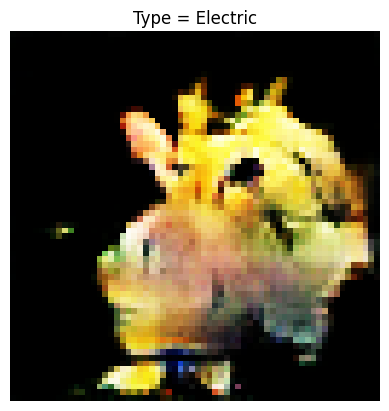

In [264]:

# Paramètres
latent_dim = 128 
wanted_type='Electric'
target_class = class_map[wanted_type]
#print(class_map_reversed[target_class])
# Vecteur de bruit
noise = tf.random.normal([1, latent_dim])  # (1, 64)

# Label sous forme d'entier (batch_size=1, shape=(1,))
label = tf.constant([[target_class]], dtype=tf.int32)  # Doit être 2D !

# Génération d'une image
generated_image = generator_loaded([noise, label], training=False)

# Post-traitement (si sortie en [-1, 1] comme ici)
img = (generated_image[0].numpy() + 1.0) / 2.0  # → [0, 1]

# 6. Affichage
plt.imshow(img)
plt.axis('off')
plt.title(f"Type = {wanted_type}")
plt.show()